# 🤗 Diffusers inference


познакомимся с библиотекой [diffusers](https://github.com/huggingface/diffusers), посмотрим на простой ddpm пайплайн и как его инферить

In [2]:
!pip install diffusers==0.35.0 -q
!pip install accelerate==1.11.0 -q

### 1. Знакомство с DDPM Pipeline из Diffusers

In [143]:
import gc
import torch
import tqdm
import requests

from torchvision.transforms.functional import to_pil_image
from io import BytesIO
from PIL import Image
from diffusers.utils import make_image_grid, load_image

In [7]:

from diffusers import DDPMPipeline # DDIMPipeline, PNDMPipeline


device = "cuda:0" if torch.cuda.is_available() else "cpu"
assert device == "cuda:0", device

model_id = "google/ddpm-cat-256"

ddpm = DDPMPipeline.from_pretrained(model_id)
ddpm = ddpm.to(device)

Keyword arguments {'allow_pickle': True} are not expected by DDPMPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


In [9]:
seed = 42

result = ddpm(batch_size=1, generator=torch.Generator().manual_seed(seed))

  0%|          | 0/1000 [00:00<?, ?it/s]

In [12]:
result

ImagePipelineOutput(images=[<PIL.Image.Image image mode=RGB size=256x256 at 0x7DE513796EA0>])

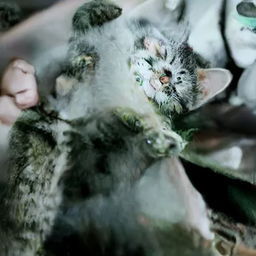

In [11]:
result.images[0]

### 2. Разбираемся в устройстве пайплайна

In [17]:
del ddpm

torch.cuda.empty_cache

repo_id = "google/ddpm-celebahq-256"

ddpm = DDPMPipeline.from_pretrained(repo_id)
ddpm = ddpm.to("cuda")

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--google--ddpm-celebahq-256/snapshots/cd5c944777ea2668051904ead6cc120739b86c4d: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--google--ddpm-celebahq-256/snapshots/cd5c944777ea2668051904ead6cc120739b86c4d.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


In [14]:
ddpm

DDPMPipeline {
  "_class_name": "DDPMPipeline",
  "_diffusers_version": "0.35.2",
  "_name_or_path": "google/ddpm-celebahq-256",
  "scheduler": [
    "diffusers",
    "DDPMScheduler"
  ],
  "unet": [
    "diffusers",
    "UNet2DModel"
  ]
}

  0%|          | 0/1000 [00:00<?, ?it/s]

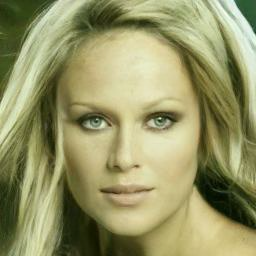

In [15]:
images=ddpm(generator=torch.Generator().manual_seed(42)).images
images[0]

In [16]:
from diffusers import UNet2DModel
from diffusers import DDPMScheduler, DDIMScheduler, DPMSolverSinglestepScheduler

In [21]:
unet = UNet2DModel.from_pretrained(repo_id)
unet = unet.to(device)

An error occurred while trying to fetch google/ddpm-celebahq-256: google/ddpm-celebahq-256 does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


In [26]:
unet.config

FrozenDict([('sample_size', 256),
            ('in_channels', 3),
            ('out_channels', 3),
            ('center_input_sample', False),
            ('time_embedding_type', 'positional'),
            ('time_embedding_dim', None),
            ('freq_shift', 1),
            ('flip_sin_to_cos', False),
            ('down_block_types',
             ['DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'AttnDownBlock2D',
              'DownBlock2D']),
            ('mid_block_type', 'UNetMidBlock2D'),
            ('up_block_types',
             ['UpBlock2D',
              'AttnUpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D']),
            ('block_out_channels', [128, 128, 256, 256, 512, 512]),
            ('layers_per_block', 2),
            ('mid_block_scale_factor', 1),
            ('downsample_padding', 0),
            ('downsample_type', 'conv'),
   

In [27]:
unet

UNet2DModel(
  (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=128, out_features=512, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=512, out_features=512, bias=True)
  )
  (down_blocks): ModuleList(
    (0-1): 2 x DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
          (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=512, out_features=128, bias=True)
          (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleList(
        (0): Downsample2D(
          (conv): Con

In [94]:
scheduler = DDPMScheduler.from_pretrained(repo_id)

scheduler

DDPMScheduler {
  "_class_name": "DDPMScheduler",
  "_diffusers_version": "0.35.2",
  "beta_end": 0.02,
  "beta_schedule": "linear",
  "beta_start": 0.0001,
  "clip_sample": true,
  "clip_sample_range": 1.0,
  "dynamic_thresholding_ratio": 0.995,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "rescale_betas_zero_snr": false,
  "sample_max_value": 1.0,
  "steps_offset": 0,
  "thresholding": false,
  "timestep_spacing": "leading",
  "trained_betas": null,
  "variance_type": "fixed_small"
}

In [30]:

noisy_sample = torch.randn(
    1,
    unet.config.in_channels,
    unet.config.sample_size,
    unet.config.sample_size,
    device=device,
    generator=torch.Generator(device).manual_seed(42)
)

sample = noisy_sample

inference_list = []

with torch.inference_mode():
  for i, t in enumerate(tqdm.tqdm(scheduler.timesteps)):
      residual = unet(sample, t).sample

      sample = scheduler.step(residual, t, sample).prev_sample
      inference_list.append(sample.detach().cpu())

100%|██████████| 1000/1000 [02:10<00:00,  7.67it/s]


In [38]:
# Визуализируйте

In [ ]:
# Попробуйте другой scheduler

### 3. Попробуем stable-diffusion-v1

In [125]:
del unet
del noisy_sample
torch.cuda.empty_cache()

In [128]:
from diffusers import StableDiffusionPipeline
from diffusers import StableDiffusionImg2ImgPipeline

repo_id = "stable-diffusion-v1-5/stable-diffusion-v1-5"

t2ipipe = StableDiffusionPipeline.from_pretrained(repo_id, torch_dtype=torch.float16)
t2ipipe = t2ipipe.to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

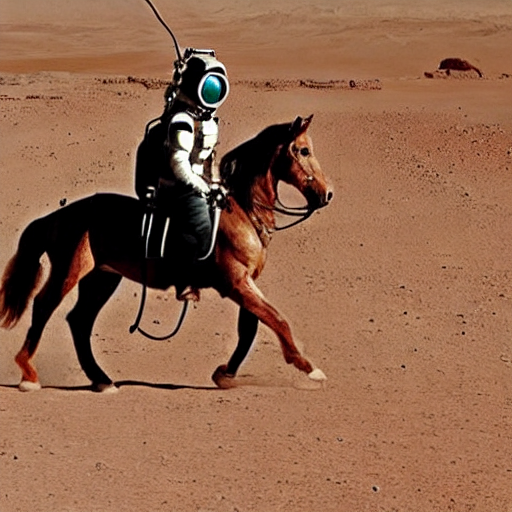

In [130]:
# пример использования

prompt = "a photo of an astronaut riding a horse on mars"
image = t2ipipe(prompt, generator=torch.Generator().manual_seed(420)).images[0]

image

In [131]:
t2ipipe

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.35.2",
  "_name_or_path": "stable-diffusion-v1-5/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [138]:
i2ipipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    repo_id,
    vae=t2ipipe.vae,
    unet=t2ipipe.unet,
    text_encoder=t2ipipe.text_encoder,
    safety_checker=None,
    torch_dtype=torch.float16
)
i2ipipe = i2ipipe.to(device);

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.StableDiffusionImg2ImgPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


init_image.size=(1024, 704)


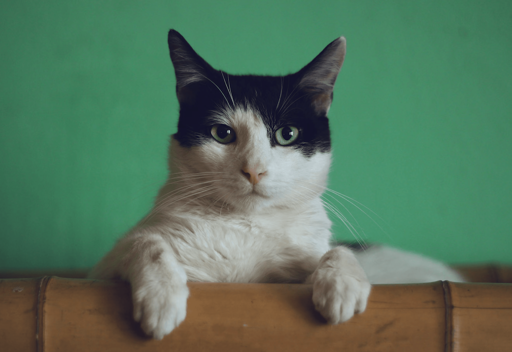

In [139]:
# визуализация работы VAE

url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/cat.png"
init_image = load_image(url)

print(f"{init_image.size=}")

init_image.resize((init_image.size[0] // 2, init_image.size[1] // 2))

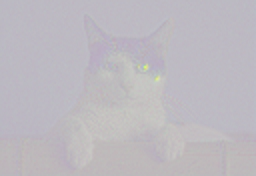

In [140]:
@torch.no_grad()
def encode(image):
    global i2ipipe
    global device
    dtype = next(i2ipipe.vae.parameters()).dtype

    image = i2ipipe.image_processor.preprocess(image)
    image = image.to(device=device, dtype=dtype)

    if i2ipipe.vae.config.force_upcast:
        image = image.float()
        i2ipipe.vae.to(dtype=torch.float32)

    latents = i2ipipe.vae.encode(image).latent_dist.sample()

    if i2ipipe.vae.config.force_upcast:
        i2ipipe.vae.to(dtype)


    latents = i2ipipe.vae.config.scaling_factor * latents
    latents = latents.cpu()
    gc.collect()
    torch.cuda.empty_cache()
    return latents

def normalize(tensor):
    return (tensor - tensor.min()) / (tensor.max() - tensor.min())

encoded = encode(init_image)
encoded_image = to_pil_image(normalize(encoded)[0])
encoded_image.resize((encoded_image.size[0] * 2, encoded_image.size[1] * 2))

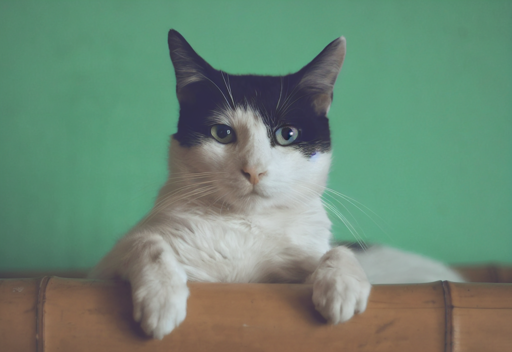

In [141]:
@torch.no_grad()
def decode(encoded):
    global i2ipipe
    global device
    encoded = encoded.to(device)
    dtype = next(i2ipipe.vae.parameters()).dtype

    if i2ipipe.vae.config.force_upcast:
        encoded = encoded.float()
        i2ipipe.vae.to(dtype=torch.float32)

    decoded = i2ipipe.vae.decode(encoded / i2ipipe.vae.config.scaling_factor)

    if i2ipipe.vae.config.force_upcast:
        i2ipipe.vae.to(dtype)

    decoded = decoded.sample.cpu()
    gc.collect()
    torch.cuda.empty_cache()
    return decoded

decoded = decode(encoded)
decoded_im = to_pil_image(normalize(decoded)[0])
decoded_im.resize((decoded_im.size[0] // 2, decoded_im.size[1] // 2))

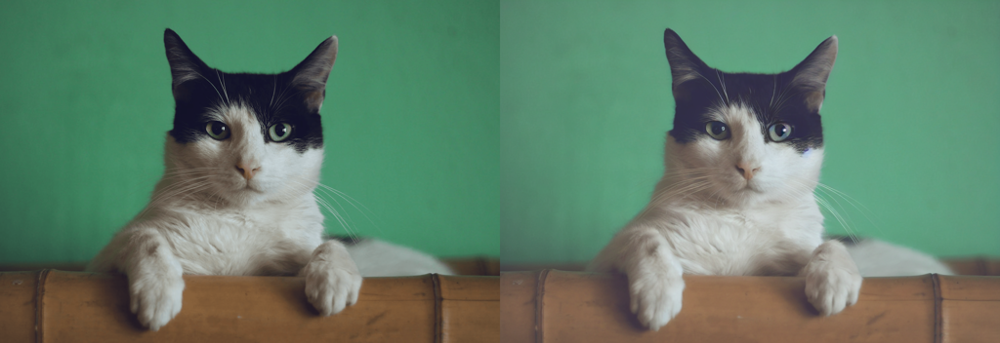

In [142]:
res = make_image_grid([init_image, decoded_im], rows=1, cols=2)
res.resize((res.size[0] // 2, res.size[1] // 2))

In [149]:
url = "https://raw.githubusercontent.com/CompVis/stable-diffusion/main/assets/stable-samples/img2img/sketch-mountains-input.jpg"
response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((768, 512))

prompt = "A fantasy landscape, trending on artstation"

image = i2ipipe(prompt=prompt, image=init_image, strength=0.75, guidance_scale=7.5, generator=torch.Generator().manual_seed(42)).images[0]

  0%|          | 0/37 [00:00<?, ?it/s]

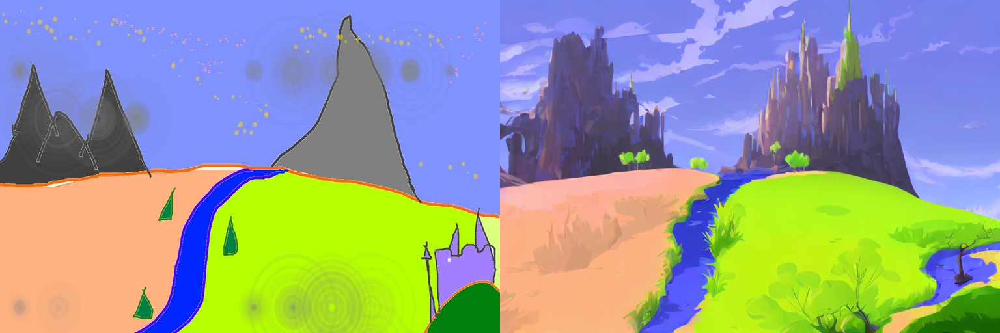

In [150]:
res = make_image_grid([init_image, image], rows=1, cols=2)
res

#### 4. Добавляем IP-adapter

In [152]:
pipeline = t2ipipe
ip_adapter_weights = "ip-adapter_sd15.bin"  # ["ip-adapter_sd15.bin","ip-adapter_sd15_light.bin","ip-adapter-plus_sd15.bin","ip-adapter-plus-face_sd15.bin"]
pipeline.load_ip_adapter("h94/IP-Adapter", subfolder="models", weight_name=ip_adapter_weights)

models/ip-adapter_sd15.bin:   0%|          | 0.00/44.6M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

models/image_encoder/model.safetensors:   0%|          | 0.00/2.53G [00:00<?, ?B/s]

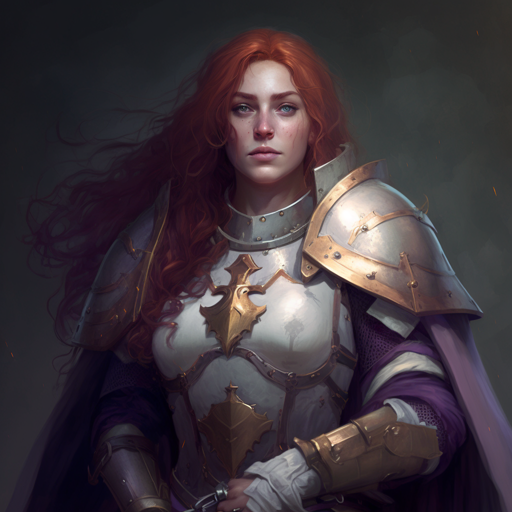

In [157]:
img_url = "https://github.com/tencent-ailab/IP-Adapter/blob/main/assets/images/woman.png?raw=true"
image = load_image(img_url)
image = image.resize((512, 512))
image

  0%|          | 0/50 [00:00<?, ?it/s]

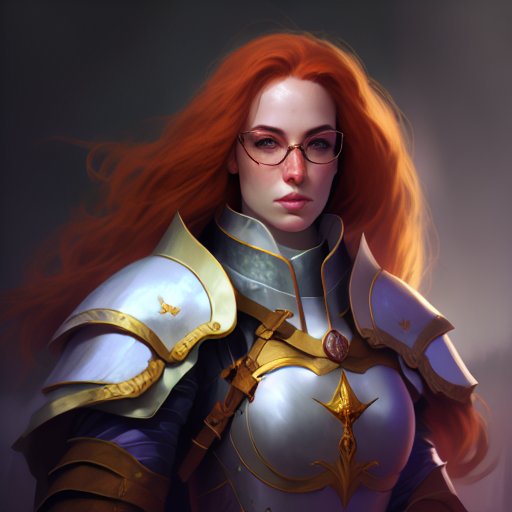

In [158]:
scale = 0.85  # @param {"type":"slider","min":0,"max":1,"step":0.05}
prompt = "girl wearing glasses"  # @param {"type":"string"}
negative_prompt = "deformed, ugly, wrong proportion, low res, bad anatomy, worst quality, low quality"
pipeline.set_ip_adapter_scale(scale)
seed = 5323  # @param {"type":"number"}

generator = torch.Generator(device="cpu").manual_seed(0)
images = pipeline(
    prompt=prompt,
    ip_adapter_image=image,
    negative_prompt=negative_prompt,
    num_inference_steps=50,
    generator=generator,
).images
images[0]

In [165]:
# ip-adapter w/ i2i pipeline

i2ipipe.image_encoder = pipeline.image_encoder

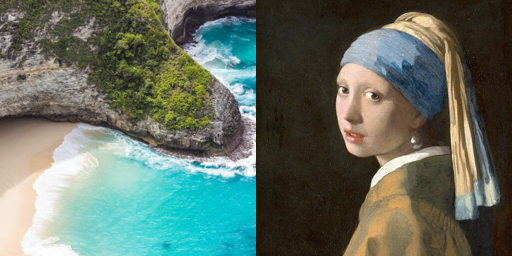

In [ ]:
input_img_url = "https://github.com/tencent-ailab/IP-Adapter/blob/main/assets/images/river.png?raw=true"
ip_adapter_img_url = "https://github.com/tencent-ailab/IP-Adapter/blob/main/assets/images/vermeer.jpg?raw=true"
image = load_image(input_img_url)
g_image = load_image(ip_adapter_img_url)
make_image_grid([image.resize((256, 256)), g_image.resize((256, 256))], 1, 2)

  0%|          | 0/25 [00:00<?, ?it/s]

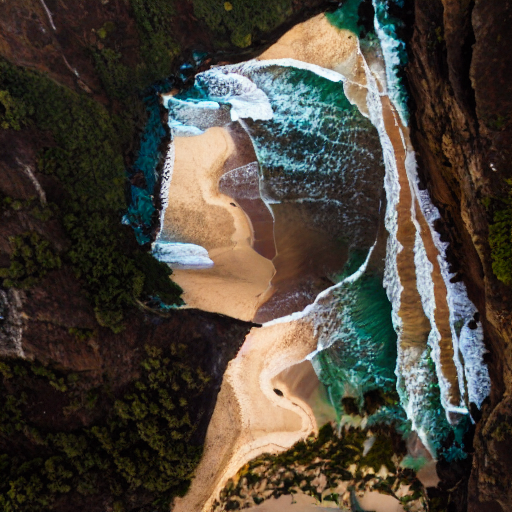

In [168]:
scale = 1  # @param {"type":"slider","min":0,"max":1,"step":0.05}
prompt = "girl "  # @param {"type":"string"}
negative_prompt = "deformed, ugly, wrong proportion, low res, bad anatomy, worst quality, low quality"
i2ipipe.set_ip_adapter_scale(scale)
seed = 5323  # @param {"type":"number"}
strength = 0.5  # @param {"type":"slider","min":0,"max":1,"step":0.05}

generator = torch.Generator(device="cpu").manual_seed(0)
images = i2ipipe(
    prompt=prompt,
    image=g_image,
    ip_adapter_image=image,
    negative_prompt=negative_prompt,
    num_inference_steps=50,
    generator=generator,
    strength=strength
).images
images[0]

### 5. Добавляем ControlNet

In [ ]:
# FIXME: надо аккуратно было чистить, сейчас без перезапуска не будет работать
import gc

import torch
import cv2
import numpy as np

from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler, DiffusionPipeline
from diffusers.utils import load_image, make_image_grid
from transformers import pipeline

from PIL import Image

In [3]:
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/cat.png"
controlnet_conditioning_scale = 1.0
prompt = "An elegant cat with thick, fluffy black and white fur, sitting in a snowy winter landscape. Snowflakes gently fall around."  #@param
original_image = load_image(
    url
)

In [4]:
controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16, use_safetensors=True)
model_id = "stable-diffusion-v1-5/stable-diffusion-v1-5"

pipe = StableDiffusionControlNetPipeline.from_pretrained(
    model_id, controlnet=controlnet, torch_dtype=torch.float16, use_safetensors=True
)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_model_cpu_offload()

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


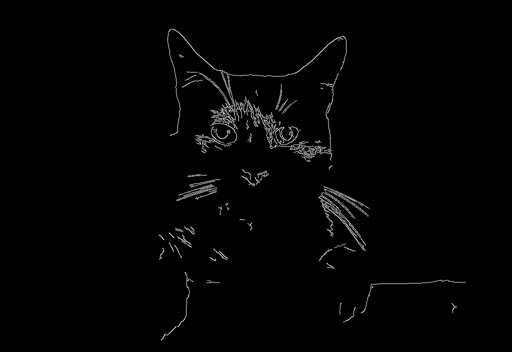

In [5]:
image = np.array(original_image)

low_threshold = 100
high_threshold = 200

image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)
canny_image.resize((canny_image.size[0] // 2, canny_image.size[1] // 2))

In [6]:
generator = torch.Generator(device="cpu").manual_seed(int(10101))
output = pipe(
    prompt,
    image=canny_image,
    generator=generator,
    controlnet_conditioning_scale=controlnet_conditioning_scale,
).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

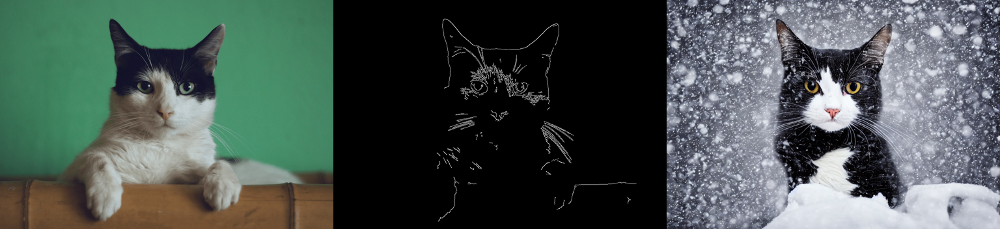

In [7]:
res = make_image_grid([original_image, canny_image, output], rows=1, cols=3)
res.resize((res.size[0] // 2, res.size[1] // 2))

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

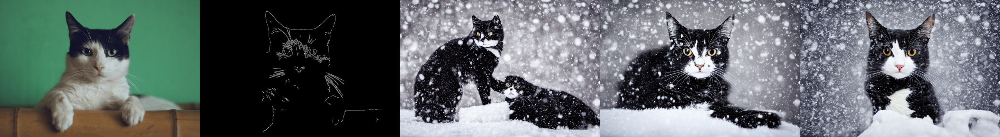

In [8]:
outputs = []
for scale in (0.0, 0.5, 1.0):
    generator = torch.Generator(device="cpu").manual_seed(int(10101))
    outputs.append(
        pipe(
            prompt,
            image=canny_image,
            generator=generator,
            controlnet_conditioning_scale=scale,
        ).images[0]
    )

res = make_image_grid([original_image, canny_image, *outputs], rows=1, cols=5)
res.resize((res.size[0] // 2, res.size[1] // 2))

config.json:   0%|          | 0.00/942 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.37G [00:00<?, ?B/s]

Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution1.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


preprocessor_config.json:   0%|          | 0.00/285 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
Device set to use cuda:0


config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

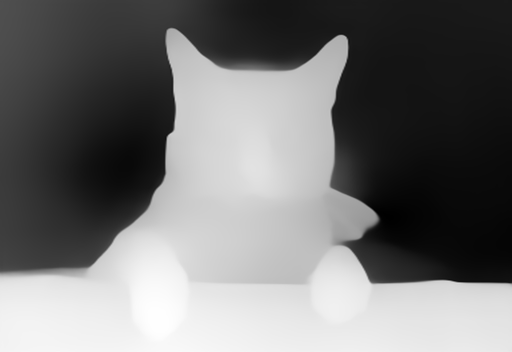

In [10]:
del pipe
torch.cuda.empty_cache()
gc.collect();

depth_estimator = pipeline('depth-estimation', model="Intel/dpt-large")

controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-depth", torch_dtype=torch.float16, use_safetensors=True)
model_id = "stable-diffusion-v1-5/stable-diffusion-v1-5"

pipe = StableDiffusionControlNetPipeline.from_pretrained(
    model_id, controlnet=controlnet, torch_dtype=torch.float16, use_safetensors=True
)
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_model_cpu_offload()


image = depth_estimator(original_image)['depth']
image = np.array(image)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
depth_image = Image.fromarray(image)

depth_image.resize((depth_image.size[0] // 2, depth_image.size[1] // 2))

  0%|          | 0/50 [00:00<?, ?it/s]

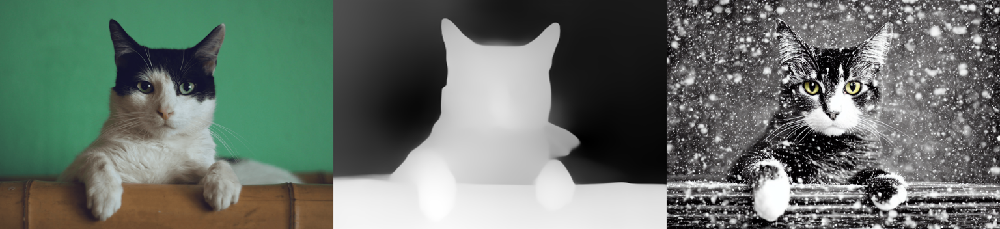

In [11]:
generator = torch.Generator(device="cpu").manual_seed(int(10101))
output = pipe(
    prompt,
    image=depth_image,
    generator=generator,
    controlnet_conditioning_scale=controlnet_conditioning_scale,
).images[0]

res = make_image_grid([original_image, depth_image, output], rows=1, cols=3)
res.resize((res.size[0] // 2, res.size[1] // 2))

In [12]:
del depth_estimator
del controlnet
del pipe
del generator

torch.cuda.empty_cache()

### 6. Используем LoRA

In [13]:
!pip install peft==0.17.1 -q

Опшинал часть, на посмотреть

Подсказки:
1. Посмотреть `LoraLoaderMixin` и `PeftAdapterMixin`
1. Для примера можно взять "ostris/ikea-instructions-lora-sdxl"
1. `cross_attention_kwargs={"scale": lora_scale}`